# Abstract
## This notebook thoroughly extracts and utilizes only small range of features present in the dataset through understanding features and decide which features are important based on domain knowlegde, feature selection methods. Evaluate selected model (huber regression based on evaluaion report from model-train-and-test-alll-features.ipynb) using test images to evaluate performance differences between features selected.
---

## Objective
### - Extracting Features:
understand problem domain to be able to extract important features. evaluate our results by using sklearn feature selection methods and apply them too.

### - Regression Modeling:
implement huber regression model for pose prediction, and compare between rather a multi-regressor model or 3 separated models.


### - Hyperparameter Tuning:
employ hyperparameter tuning to optimize its performance using Optuna.

### - Evaluation and Comparison of Models:
evaluate the performance of different feature selection methods, comparing their effectiveness in head pose estimation tasks.

---

## Output
**Report of fitted model and its performance.**
---

### import important libraries

In [1]:
%%capture
!pip install mediapipe

In [2]:
!pip install optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 18.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.9 MB/s eta 0:00:00


In [3]:
import optuna
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression
from sklearn.model_selection import train_test_split
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import HuberRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import cv2
import mediapipe as mp
import numpy as np
import matplotlib.pyplot as plt
import os,cv2,math,glob,random
import scipy.io as sio
from math import cos, sin
from pathlib import Path
import pandas as pd
import mediapipe
import warnings
warnings.filterwarnings('ignore')
from google.colab.patches import cv2_imshow

###loading the dataset

In [ ]:
df = pd.read_csv('/content/face_landmarks.csv')
df

,x_0,y_0,x_1,y_1,x_2,y_2,x_3,y_3,x_4,y_4,...,y_464,x_465,y_465,x_466,y_466,x_467,y_467,pitch,yaw,roll
0,-121,139,-12,37,-109,70,-61,-86,0,0,...,-197,-90,-186,-42,-228,-37,-253,-1.108159,-1.443685,1.129171
1,52,100,7,24,43,35,-8,-75,0,0,...,-182,92,-169,275,-223,292,-244,-0.373085,0.293578,-0.125011
2,0,79,0,23,0,29,-24,-77,0,0,...,-189,46,-176,212,-244,223,-254,-0.474087,-0.040907,0.019801
3,-37,94,-4,29,-23,48,-26,-76,0,0,...,-147,26,-141,165,-161,177,-164,-0.116700,-0.233745,0.095809
4,-94,139,-8,35,-98,70,-70,-77,0,0,...,-190,-118,-178,-87,-232,-85,-247,-0.379067,-0.985426,0.086955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,-77,129,-9,31,-66,56,-45,-79,0,0,...,-182,-38,-171,48,-224,55,-238,-0.266459,-0.722653,0.219750
1849,7,105,-1,29,7,48,-11,-77,0,0,...,-158,81,-151,261,-180,275,-190,-0.161717,0.085792,0.027202
1850,52,114,2,30,43,59,6,-65,0,0,...,-134,119,-129,300,-158,322,-168,-0.046365,0.580349,-0.023616
1851,-6,134,2,27,-12,70,-38,-50,0,0,...,-114,0,-109,115,-144,125,-164,-0.948136,-1.241852,1.234426


# Feature Selection (domain based)
### As all points are extremely close and don't offer new information, using all points is just an overhead. <br>
by understanding our problem and the features we need to solve this problem, we can decide the important facial landmarks that give the information we need.<br>
in my POV, these points represent in: <br>

* Nose Tip (Landmark ID: 4): Coordinates for the tip of the nose.
* Left Eye Inner Corner (Landmark ID: 246): Coordinates for the inner corner of the left eye.
* Right Eye Inner Corner (Landmark ID: 446): Coordinates for the inner corner of the right eye.
* Left Eye Outer Corner (Landmark ID: 33): Coordinates for the outer corner of the left eye.
* Right Eye Outer Corner (Landmark ID: 263): Coordinates for the outer corner of the right eye.
* Left Mouth Corner (Landmark ID: 61): Coordinates for the left corner of the mouth.
*Right Mouth Corner (Landmark ID: 291): Coordinates for the right corner of the mouth.
* Chin (Landmark ID: 152): Coordinates for the bottom center of the chin.
* Left Cheek (Landmark ID: 31): Coordinates for the left cheekbone.
* Right Cheek (Landmark ID: 251): Coordinates for the right cheekbone.
* Top of Head (Landmark ID: 10): Coordinates for the top center of the head.
* Bottom of Chin (Landmark ID: 152): Coordinates for the bottom center of the chin.






In [ ]:
# Define a list with the points we need to extract
points_to_extract = [4, 246, 446, 33, 263, 61, 291, 152, 31, 251, 10]

# Initialize a list to store extracted columns
extracted_columns = []

# Iterate over the dataset columns
for p in points_to_extract:
    # Extract x and y columns for the current point
    x_column = f"x_{p}"
    y_column = f"y_{p}"
    extracted_columns.append(df[x_column])
    extracted_columns.append(df[y_column])

extracted_columns.append(df["pitch"])
extracted_columns.append(df["yaw"])
extracted_columns.append(df["roll"])

# Concatenate extracted columns into a new DataFrame
selected_landmarks_df = pd.concat(extracted_columns, axis=1)
selected_landmarks_df

,x_4,y_4,x_246,y_246,x_446,y_446,x_33,y_33,x_263,y_263,...,y_152,x_31,y_31,x_251,y_251,x_10,y_10,pitch,yaw,roll
0,0,0,-355,-212,-58,-223,-371,-209,-47,-226,...,422,-441,-179,-104,-364,-80,-518,-1.108159,-1.443685,1.129171
1,0,0,-113,-202,323,-224,-115,-202,285,-223,...,280,-115,-172,424,-386,2,-439,-0.373085,0.293578,-0.125011
2,0,0,-220,-232,241,-238,-225,-229,217,-241,...,245,-242,-194,306,-389,-8,-451,-0.474087,-0.040907,0.019801
3,0,0,-235,-197,187,-141,-244,-194,169,-156,...,347,-274,-164,233,-247,10,-401,-0.116700,-0.233745,0.095809
4,0,0,-385,-175,-104,-223,-400,-172,-93,-231,...,397,-462,-123,-153,-354,-133,-489,-0.379067,-0.985426,0.086955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1848,0,0,-311,-211,44,-211,-322,-207,46,-220,...,345,-360,-164,47,-335,-32,-457,-0.266459,-0.722653,0.219750
1849,0,0,-163,-205,296,-167,-168,-201,268,-176,...,310,-185,-165,389,-291,49,-421,-0.161717,0.085792,0.027202
1850,0,0,-77,-148,359,-145,-79,-143,313,-154,...,397,-90,-104,505,-274,72,-389,-0.046365,0.580349,-0.023616
1851,0,0,-243,-113,140,-139,-253,-107,121,-140,...,418,-280,-70,158,-264,-74,-390,-0.948136,-1.241852,1.234426


Now, we reduced features dimensions from 936 t0 22, which way more simpler to the model.

### Features-labels split and train-validation-test split

In [ ]:
labels = selected_landmarks_df[['pitch', 'yaw', 'roll']]
Pitch = selected_landmarks_df[['pitch']]
Yaw = selected_landmarks_df[['yaw']]
Roll = selected_landmarks_df[['roll']]
features = selected_landmarks_df.drop(['pitch', 'yaw', 'roll'], axis=1)

In [ ]:
x_train, x_validation, y_train, y_validation = train_test_split(features, labels, test_size=0.2, random_state=42)
x_train, x_validation, pitch_train, pitch_validation = train_test_split(features, Pitch, test_size=0.2, random_state=42)
x_train, x_validation, yaw_train, yaw_validation = train_test_split(features, Yaw, test_size=0.2, random_state=42)
x_train, x_validation, roll_train, roll_validation = train_test_split(features, Roll, test_size=0.2, random_state=42)

## Get the best parameters for each regression model using Optuna

**Optuna is a hyperparameter optimization framework designed to automate the process of tuning machine learning model parameters.** <br>[see Optuna docs](https://optuna.org/)<br>

note: multi Output Regressor were used to find the best optimized model
without making 3 medels at the beginning for code simplicity.
<br>
<br>
<br>

- Linear Regression.

In [ ]:
# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    positive = trial.suggest_categorical('positive', [True, False])
    n_jobs = trial.suggest_categorical('n_jobs', [-1, 1, 2])

    # Create Linear Regression model
    lr = LinearRegression(fit_intercept=fit_intercept, positive=positive, n_jobs=n_jobs)

    # Create MultiOutputRegressor
    multi_out_lr = MultiOutputRegressor(lr)

    # Fit the model
    multi_out_lr.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, multi_out_lr.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)


[I 2024-05-16 18:32:31,149] A new study created in memory with name: no-name-fc3c4f15-876f-44a3-9d2b-2fedf57e1bae
[I 2024-05-16 18:32:31,198] Trial 0 finished with value: 0.18770641709689975 and parameters: {'fit_intercept': False, 'positive': True, 'n_jobs': 1}. Best is trial 0 with value: 0.18770641709689975.
[I 2024-05-16 18:32:31,269] Trial 1 finished with value: 0.18831264197218564 and parameters: {'fit_intercept': True, 'positive': False, 'n_jobs': 2}. Best is trial 0 with value: 0.18770641709689975.
[I 2024-05-16 18:32:31,308] Trial 2 finished with value: 0.18831264197218564 and parameters: {'fit_intercept': True, 'positive': False, 'n_jobs': 2}. Best is trial 0 with value: 0.18770641709689975.
[I 2024-05-16 18:32:31,340] Trial 3 finished with value: 0.18770641709689975 and parameters: {'fit_intercept': False, 'positive': True, 'n_jobs': 1}. Best is trial 0 with value: 0.18770641709689975.
[I 2024-05-16 18:32:31,372] Trial 4 finished with value: 0.18770641709689975 and parameter

Best Hyperparameters: {'fit_intercept': False, 'positive': False, 'n_jobs': 2}
Best Validation RMSE: 0.18268354872737438


- Ridge Regression.

In [ ]:
def objective(trial):
    # Define hyperparameters to tune
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    solver = trial.suggest_categorical('solver', ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Ridge Regression model
    ridge = Ridge(alpha=alpha, fit_intercept=fit_intercept, solver=solver, max_iter=max_iter)

    # Create MultiOutputRegressor
    multi_out_ridge = MultiOutputRegressor(ridge)

    # Fit the model
    multi_out_ridge.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, multi_out_ridge.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-16 18:34:47,394] A new study created in memory with name: no-name-a0bc8c6c-fbd6-4107-b35c-5d26df6bded3
[I 2024-05-16 18:34:48,907] Trial 0 finished with value: 0.17502739574309387 and parameters: {'fit_intercept': False, 'alpha': 158.31310554671697, 'solver': 'sag', 'max_iter': 706}. Best is trial 0 with value: 0.17502739574309387.
[I 2024-05-16 18:34:51,010] Trial 1 finished with value: 0.17916342077798844 and parameters: {'fit_intercept': True, 'alpha': 0.13570385691560138, 'solver': 'saga', 'max_iter': 774}. Best is trial 0 with value: 0.17502739574309387.
[I 2024-05-16 18:34:51,109] Trial 2 finished with value: 0.18708344276242736 and parameters: {'fit_intercept': True, 'alpha': 0.022073592225077432, 'solver': 'lsqr', 'max_iter': 279}. Best is trial 0 with value: 0.17502739574309387.
[I 2024-05-16 18:34:51,177] Trial 3 finished with value: 0.18818227832808745 and parameters: {'fit_intercept': True, 'alpha': 4.963951406915771, 'solver': 'auto', 'max_iter': 488}. Best is t

Best Hyperparameters: {'fit_intercept': False, 'alpha': 0.004475065555359896, 'solver': 'saga', 'max_iter': 105}
Best Validation RMSE: 0.1611812152173679


- Lasso Regression.

In [ ]:
# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    precompute = trial.suggest_categorical('precompute', [True, False])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Lasso Regression model
    lasso = Lasso(alpha=alpha, fit_intercept=fit_intercept, precompute=precompute, max_iter=max_iter)

    # Create MultiOutputRegressor
    multi_out_lasso = MultiOutputRegressor(lasso)

    # Fit the model
    multi_out_lasso.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, multi_out_lasso.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-16 18:36:04,230] A new study created in memory with name: no-name-5e937716-a897-4a89-aaa2-5385698dc470
[I 2024-05-16 18:36:04,263] Trial 0 finished with value: 0.17287235242631033 and parameters: {'fit_intercept': True, 'alpha': 0.01964321989336475, 'precompute': True, 'max_iter': 856}. Best is trial 0 with value: 0.17287235242631033.
[I 2024-05-16 18:36:04,331] Trial 1 finished with value: 0.14646514690211032 and parameters: {'fit_intercept': False, 'alpha': 1.6979283995743997, 'precompute': False, 'max_iter': 995}. Best is trial 1 with value: 0.14646514690211032.
[I 2024-05-16 18:36:04,387] Trial 2 finished with value: 0.4190512889428071 and parameters: {'fit_intercept': False, 'alpha': 144.26115199672884, 'precompute': False, 'max_iter': 567}. Best is trial 1 with value: 0.14646514690211032.
[I 2024-05-16 18:36:04,413] Trial 3 finished with value: 0.14674110004136073 and parameters: {'fit_intercept': False, 'alpha': 1.1088115559889344, 'precompute': True, 'max_iter': 137}

Best Hyperparameters: {'fit_intercept': False, 'alpha': 1.3312431004233207, 'precompute': False, 'max_iter': 311}
Best Validation RMSE: 0.14622556800577594


- Support Vector Regression.

In [ ]:
# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    kernel = trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf', 'sigmoid'])
    C = trial.suggest_loguniform('C', 1e-3, 1e3)
    epsilon = trial.suggest_uniform('epsilon', 0.1, 1.0)
    degree = trial.suggest_int('degree', 2, 5) if kernel == 'poly' else 3
    gamma = trial.suggest_categorical('gamma', ['scale', 'auto']) if kernel in ['rbf', 'poly', 'sigmoid'] else 'scale'

    # Create SVR model
    svr = SVR(kernel=kernel, C=C, epsilon=epsilon, degree=degree, gamma=gamma)

    # Create MultiOutputRegressor
    multi_out_svr = MultiOutputRegressor(svr)

    # Fit the model
    multi_out_svr.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, multi_out_svr.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
sampler = optuna.samplers.TPESampler()
study = optuna.create_study(direction='minimize', sampler=sampler, pruner=optuna.pruners.MedianPruner())
study.optimize(objective, n_trials=100, n_jobs=-1)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-22 06:31:35,162] A new study created in memory with name: no-name-c3fdb03e-4f7a-4d9b-858e-77a56ae1920a
[I 2024-05-22 06:31:35,277] Trial 1 finished with value: 0.41716884532038173 and parameters: {'kernel': 'sigmoid', 'C': 0.0012174587826109956, 'epsilon': 0.672928948948685, 'gamma': 'auto'}. Best is trial 1 with value: 0.41716884532038173.
[I 2024-05-22 06:31:35,385] Trial 0 finished with value: 0.18716218287000852 and parameters: {'kernel': 'poly', 'C': 5.337021643176795, 'epsilon': 0.35076055902285574, 'degree': 2, 'gamma': 'scale'}. Best is trial 0 with value: 0.18716218287000852.
[I 2024-05-22 06:31:35,502] Trial 3 finished with value: 0.2991327330121649 and parameters: {'kernel': 'rbf', 'C': 0.006699106716421176, 'epsilon': 0.513511401767635, 'gamma': 'scale'}. Best is trial 0 with value: 0.18716218287000852.
[I 2024-05-22 06:31:37,031] Trial 2 finished with value: 0.13327125725996394 and parameters: {'kernel': 'rbf', 'C': 238.86622728312045, 'epsilon': 0.1285184207273

KeyboardInterrupt: 

`although SVR make the best performance, it takes hours for tuning without converging`

- K-Nearest Neighbors Regression.

In [ ]:
# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    n_neighbors = trial.suggest_int('n_neighbors', 1, 10)
    weights = trial.suggest_categorical('weights', ['uniform', 'distance'])
    algorithm = trial.suggest_categorical('algorithm', ['auto', 'ball_tree', 'kd_tree', 'brute'])

    # Create K-Nearest Neighbors Regression model
    knn = KNeighborsRegressor(n_neighbors=n_neighbors, weights=weights, algorithm=algorithm)

    # Fit the model
    knn.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, knn.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-14 21:41:36,473] A new study created in memory with name: no-name-f7e9371e-3c54-41e6-9b6d-ae90084d9f87
[I 2024-05-14 21:41:36,619] Trial 0 finished with value: 0.6644110577363782 and parameters: {'n_neighbors': 1, 'weights': 'distance', 'algorithm': 'auto'}. Best is trial 0 with value: 0.6644110577363782.
[I 2024-05-14 21:41:37,527] Trial 1 finished with value: 0.1990651288025325 and parameters: {'n_neighbors': 8, 'weights': 'uniform', 'algorithm': 'ball_tree'}. Best is trial 1 with value: 0.1990651288025325.
[I 2024-05-14 21:41:37,669] Trial 2 finished with value: 0.21214930004429242 and parameters: {'n_neighbors': 9, 'weights': 'distance', 'algorithm': 'brute'}. Best is trial 1 with value: 0.1990651288025325.
[I 2024-05-14 21:41:37,865] Trial 3 finished with value: 0.18559501078179655 and parameters: {'n_neighbors': 9, 'weights': 'uniform', 'algorithm': 'brute'}. Best is trial 3 with value: 0.18559501078179655.
[I 2024-05-14 21:41:38,634] Trial 4 finished with value: 0.470

Best Hyperparameters: {'n_neighbors': 10, 'weights': 'uniform', 'algorithm': 'auto'}
Best Validation RMSE: 0.17520974462731873


- Huber Regression.

In [ ]:
# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Huber Regression model
    huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

    # Create MultiOutputRegressor
    multi_out_huber = MultiOutputRegressor(huber)

    # Fit the model
    multi_out_huber.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, multi_out_huber.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-14 21:42:20,300] A new study created in memory with name: no-name-b4b2ab75-c3db-444f-95f4-a84fd6949b7f
[I 2024-05-14 21:42:44,240] Trial 0 finished with value: 0.33972122142145095 and parameters: {'epsilon': 1.5562637430543682, 'alpha': 0.47179832179447984, 'fit_intercept': True, 'max_iter': 623}. Best is trial 0 with value: 0.33972122142145095.
[I 2024-05-14 21:43:23,102] Trial 1 finished with value: 0.25960959044545173 and parameters: {'epsilon': 1.9496778596206077, 'alpha': 64.63533863576089, 'fit_intercept': True, 'max_iter': 843}. Best is trial 1 with value: 0.25960959044545173.
[I 2024-05-14 21:43:45,153] Trial 2 finished with value: 0.31791690374430276 and parameters: {'epsilon': 1.9662962002629385, 'alpha': 0.7886828817861505, 'fit_intercept': False, 'max_iter': 552}. Best is trial 1 with value: 0.25960959044545173.
[I 2024-05-14 21:44:19,218] Trial 3 finished with value: 0.2627858804933495 and parameters: {'epsilon': 1.379783692452868, 'alpha': 0.12638716563961447, 

Best Hyperparameters: {'epsilon': 1.986235054274329, 'alpha': 545.6228746307662, 'fit_intercept': True, 'max_iter': 103}
Best Validation RMSE: 0.1429986060385563



*   Decision Tree Regressor


In [ ]:
# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    max_depth = trial.suggest_int('max_depth', 2, 10)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)

    # Create Decision Tree Regressor model
    dt = DecisionTreeRegressor(max_depth=max_depth, min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf)

    # Create MultiOutputRegressor
    multi_out_dt = MultiOutputRegressor(dt)

    # Fit the model
    multi_out_dt.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, multi_out_dt.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-14 22:06:28,430] A new study created in memory with name: no-name-19d6e604-fac6-45a7-adee-e84795dd687d
[I 2024-05-14 22:06:32,023] Trial 0 finished with value: 0.26268089123219307 and parameters: {'max_depth': 9, 'min_samples_split': 12, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.26268089123219307.
[I 2024-05-14 22:06:32,941] Trial 1 finished with value: 0.3225292382808397 and parameters: {'max_depth': 3, 'min_samples_split': 3, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.26268089123219307.
[I 2024-05-14 22:06:33,560] Trial 2 finished with value: 0.32460418094886556 and parameters: {'max_depth': 2, 'min_samples_split': 17, 'min_samples_leaf': 9}. Best is trial 0 with value: 0.26268089123219307.
[I 2024-05-14 22:06:36,037] Trial 3 finished with value: 0.2826072541855887 and parameters: {'max_depth': 10, 'min_samples_split': 4, 'min_samples_leaf': 8}. Best is trial 0 with value: 0.26268089123219307.
[I 2024-05-14 22:06:37,487] Trial 4 finished with value: 

Best Hyperparameters: {'max_depth': 9, 'min_samples_split': 10, 'min_samples_leaf': 10}
Best Validation RMSE: 0.24325417079372694


## let's test on photos using SVR

In [ ]:
def draw_axes(img, pitch,yaw,roll, center_point, size = 100):

    yaw = -yaw

    if center_point is None:
        height, width = img.shape[:2]
        center_point = (width / 2, height / 2)

    tdx, tdy = center_point

    # X-Axis pointing to right. drawn in red
    x1 = size * (cos(yaw) * cos(roll)) + tdx
    y1 = size * (cos(pitch) * sin(roll) + cos(roll) * sin(pitch) * sin(yaw)) + tdy

    # Y-Axis | drawn in green
    #        v
    x2 = size * (-cos(yaw) * sin(roll)) + tdx
    y2 = size * (cos(pitch) * cos(roll) - sin(pitch) * sin(yaw) * sin(roll)) + tdy

    # Z-Axis (out of the screen) drawn in blue
    x3 = size * (sin(yaw)) + tdx
    y3 = size * (-cos(yaw) * sin(pitch)) + tdy

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    cv2.line(img, (int(tdx), int(tdy)), (int(x1),int(y1)),(0,0,255),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x2),int(y2)),(0,255,0),3)
    cv2.line(img, (int(tdx), int(tdy)), (int(x3),int(y3)),(255,0,0),2)

    return img

In [ ]:
def axes_prediction(img_path, model):
    # Indices of the required landmarks
    required_landmarks = [4, 246, 446, 33, 263, 61, 291, 152, 31, 251, 10]
    data = []

    faceModule = mp.solutions.face_mesh

    # Loading the image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Creating a FaceMesh instance
    with faceModule.FaceMesh(static_image_mode=True) as faces:

        # Processing the face to extract the landmark points for x, y
        results = faces.process(image)

        # Checking if there are multiple face landmarks detected
        if results.multi_face_landmarks:

            nose_x, nose_y, lower_x, lower_y, upper_x, upper_y = None, None, None, None, None, None

            # Looping over the faces in the image
            for idx, lm in enumerate(results.multi_face_landmarks[0].landmark):
                if idx in required_landmarks:
                    if idx == 4:
                        nose_x = lm.x
                        nose_y = lm.y
                    elif idx == 291:
                        lower_x = lm.x
                        lower_y = lm.y
                    elif idx == 33:
                        upper_x = lm.x
                        upper_y = lm.y

            # Check if all required points are found
            if nose_x is not None and lower_x is not None and upper_x is not None:
                distance_x = upper_x - lower_x
                distance_y = upper_y - lower_y
                distance = np.sqrt(distance_x**2 + distance_y**2)

                for face in results.multi_face_landmarks:
                    for idx, landmark in enumerate(face.landmark):
                        if idx in required_landmarks:
                            x = (landmark.x - nose_x) / distance
                            y = (landmark.y - nose_y) / distance
                            shape = image.shape
                            x = int(x * shape[1])
                            y = int(y * shape[0])
                            data.extend([x, y])

    data
    dd = np.array(data)
    dd = dd.reshape(1, -1)

    if model == 'single':
        pitch = svr_pitch.predict(dd)
        yaw = svr_yaw.predict(dd)
        roll = svr_roll.predict(dd)
    else:
        pitch, yaw, roll = multi_out_svr.predict(dd).ravel()

    h, w, c = image.shape
    center_point = (nose_x * w, nose_y * h)

    cv2_imshow(draw_axes(image, pitch, yaw, roll, center_point))

    return

### train 3 models

In [ ]:
# train 3 models
svr_pitch = SVR(kernel='rbf', C=74.09399809493105, epsilon=0.10584600684290432, gamma='scale', degree=3).fit(x_train, pitch_train)
svr_yaw = SVR(kernel='rbf', C=74.09399809493105, epsilon=0.10584600684290432, gamma='scale', degree=3).fit(x_train, yaw_train)
svr_roll = SVR(kernel='rbf', C=74.09399809493105, epsilon=0.10584600684290432, gamma='scale', degree=3).fit(x_train, roll_train)


# Make predictions
pitch_pred_train = svr_pitch.predict(x_train)
pitch_pred_test = svr_pitch.predict(x_validation)

yaw_pred_train = svr_yaw.predict(x_train)
yaw_pred_test = svr_yaw.predict(x_validation)

roll_pred_train = svr_roll.predict(x_train)
roll_pred_test = svr_roll.predict(x_validation)

# Evaluate the model
mse_train_pitch = mean_squared_error(pitch_train, pitch_pred_train)
mse_test_pitch = mean_squared_error(pitch_validation, pitch_pred_test)
r2_train_pitch = r2_score(pitch_train, pitch_pred_train)
r2_test_pitch = r2_score(pitch_validation, pitch_pred_test)

mse_train_yaw = mean_squared_error(yaw_train, yaw_pred_train)
mse_test_yaw = mean_squared_error(yaw_validation, yaw_pred_test)
r2_train_yaw = r2_score(yaw_train, yaw_pred_train)
r2_test_yaw = r2_score(yaw_validation, yaw_pred_test)

mse_train_roll = mean_squared_error(roll_train, roll_pred_train)
mse_test_roll = mean_squared_error(roll_validation, roll_pred_test)
r2_train_roll = r2_score(roll_train, roll_pred_train)
r2_test_roll = r2_score(roll_validation, roll_pred_test)


# Print evaluation metrics
print('Pitch Evaluation')
print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_pitch, mse_test_pitch))
print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_pitch, r2_test_pitch))
print('\n')
print('Yaw Evaluation')
print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_yaw, mse_test_yaw))
print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_yaw, r2_test_yaw))
print('\n')
print('Roll Evaluation')
print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_roll, mse_test_roll))
print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_roll, r2_test_roll))

Pitch Evaluation
Mean Squared Error (MSE) - Train: 0.2835, Test: 0.0151
R-squared (R2) - Train: 0.2065, Test: 0.8099


Yaw Evaluation
Mean Squared Error (MSE) - Train: 0.0441, Test: 0.0131
R-squared (R2) - Train: 0.8704, Test: 0.9587


Roll Evaluation
Mean Squared Error (MSE) - Train: 0.3279, Test: 0.0145
R-squared (R2) - Train: 0.3413, Test: 0.8734


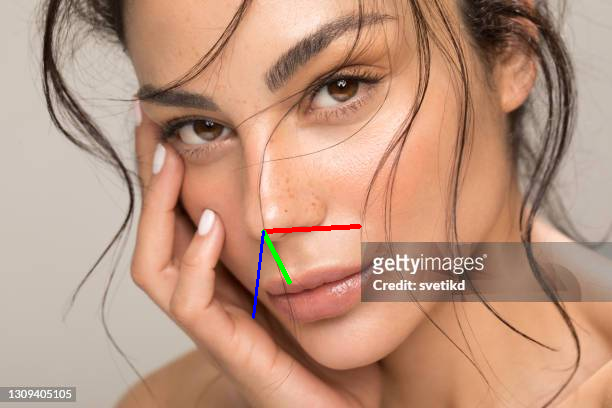

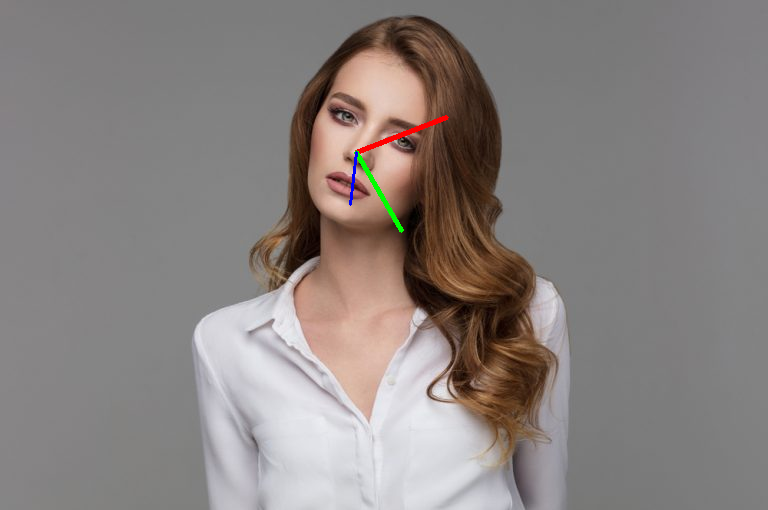

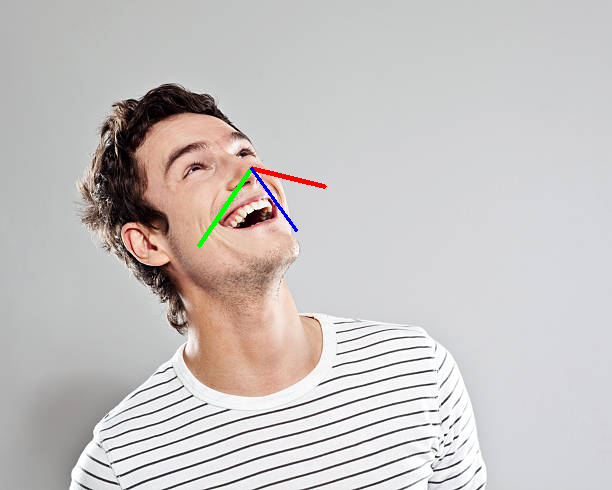

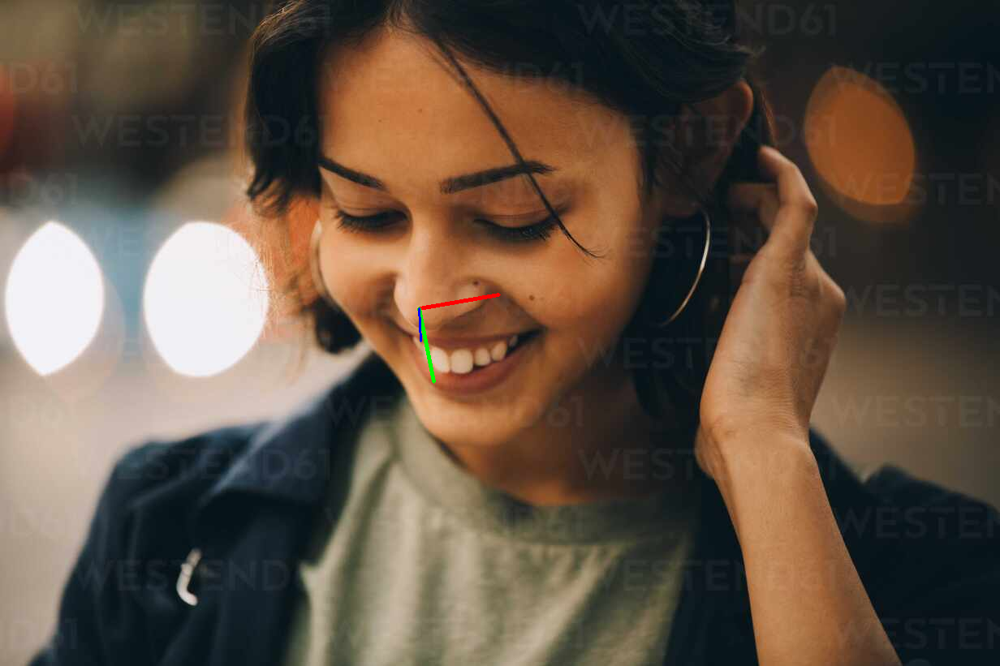

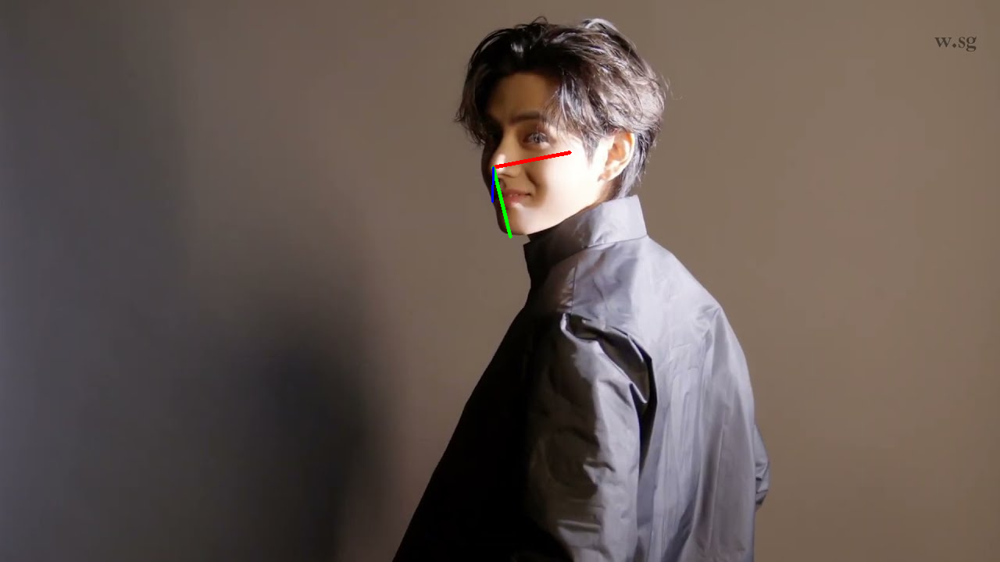

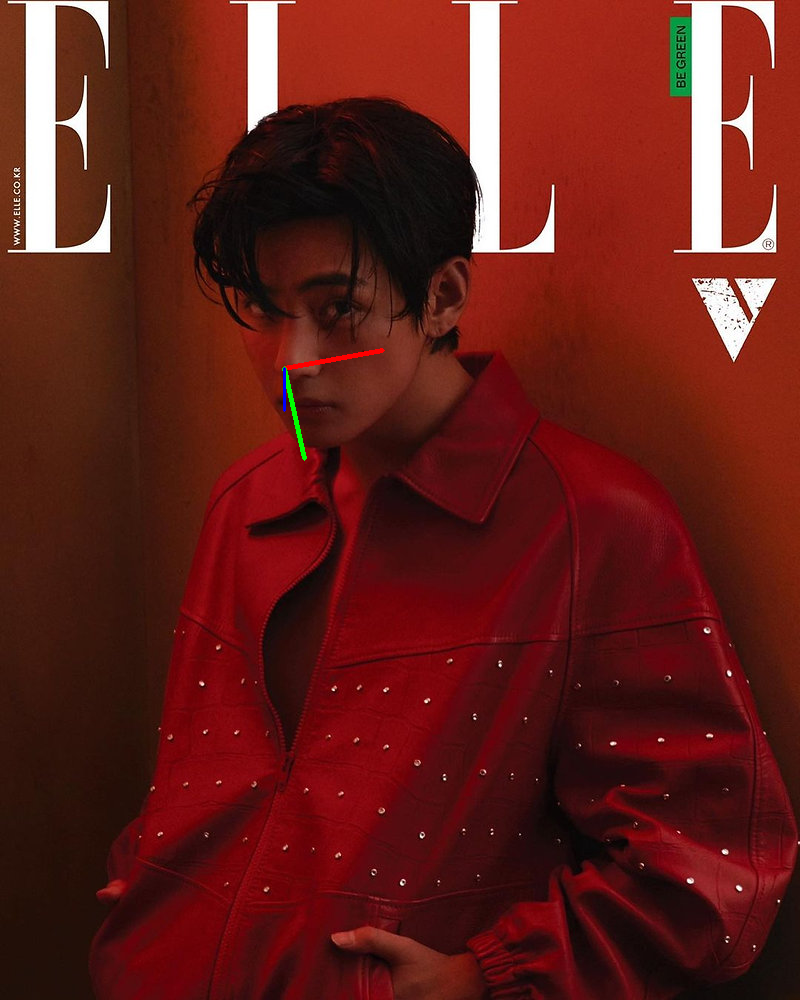

In [ ]:
for i in range(1, 7):
    img_path = f'/content/drive/MyDrive/test photos/test{i}.jpg'
    model = 'single'
    axes_prediction(img_path, model)

### train multi-model

In [ ]:
# Create SVR multi-model
svr = SVR(kernel='rbf', C=74.09399809493105, epsilon=0.10584600684290432, gamma='scale', degree=3)
multi_out_svr = MultiOutputRegressor(svr)

# Fit the model
multi_out_svr.fit(x_train, y_train)

# Make predictions
y_pred_train = multi_out_svr.predict(x_train)
y_pred_test = multi_out_svr.predict(x_validation)

# Evaluate the model
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse_test = np.sqrt(mean_squared_error(y_validation, y_pred_test))
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_validation, y_pred_test)

# Print evaluation metrics
print('data Evaluation')
print("Root Mean Squared Error (RMSE) - Train: {:.4f}, Test: {:.4f}".format(rmse_train, rmse_test))
print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train, r2_test))

data Evaluation
Root Mean Squared Error (RMSE) - Train: 0.4674, Test: 0.1193
R-squared (R2) - Train: 0.4727, Test: 0.8806


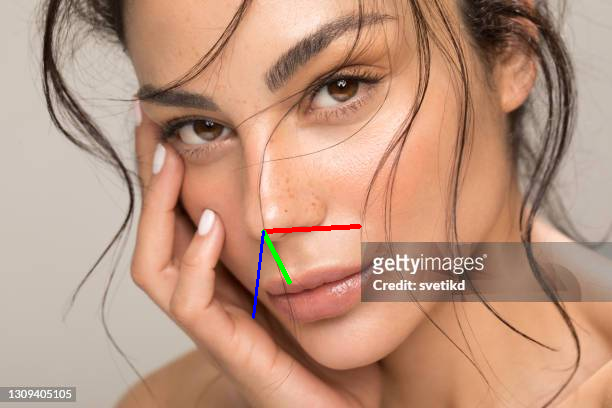

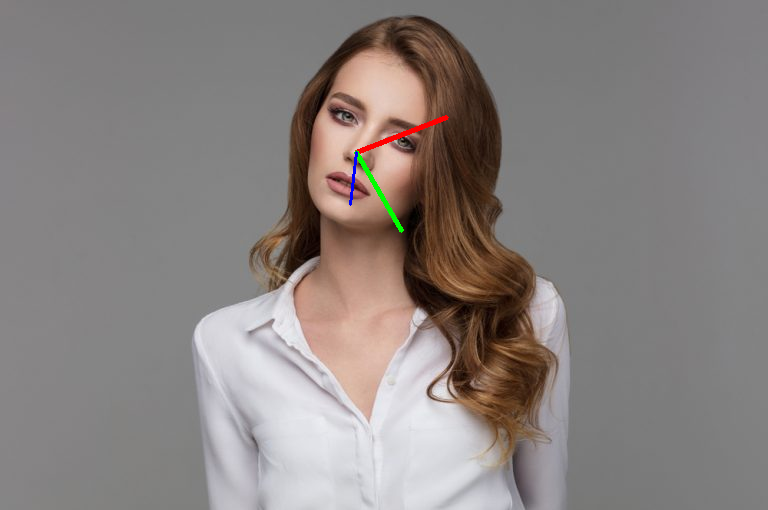

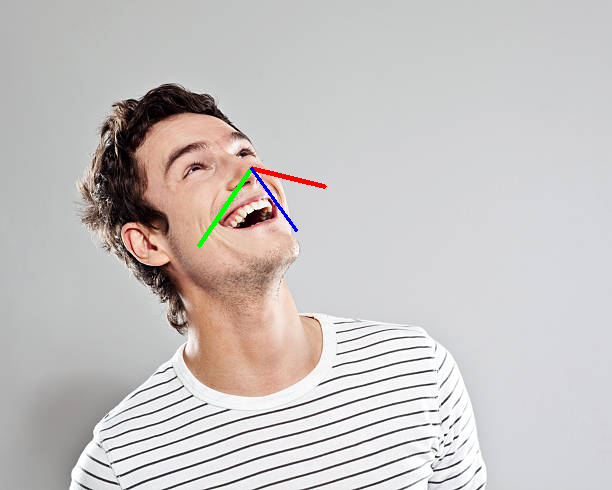

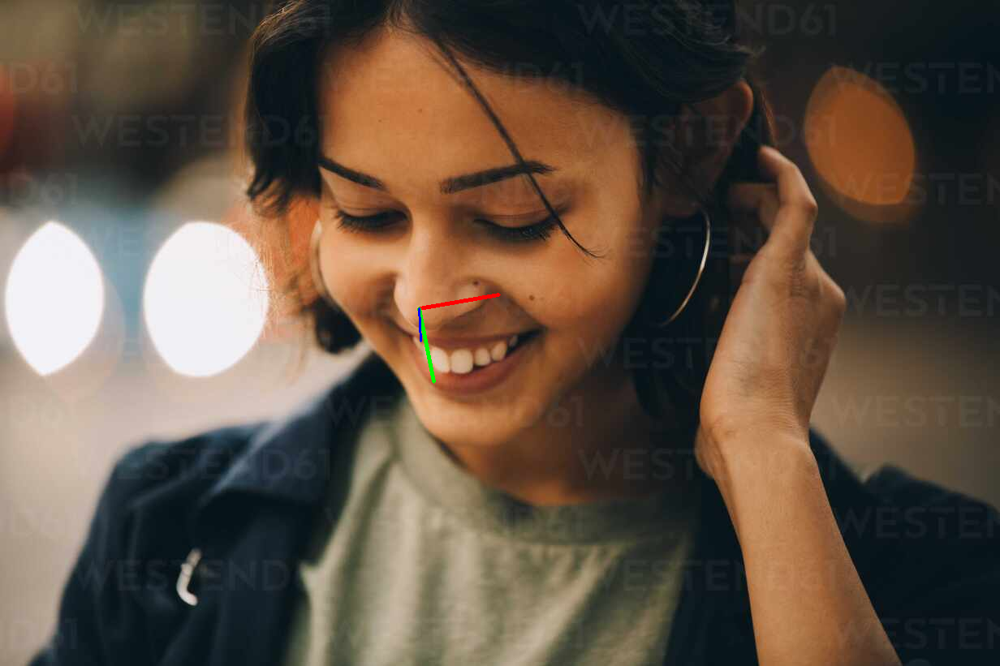

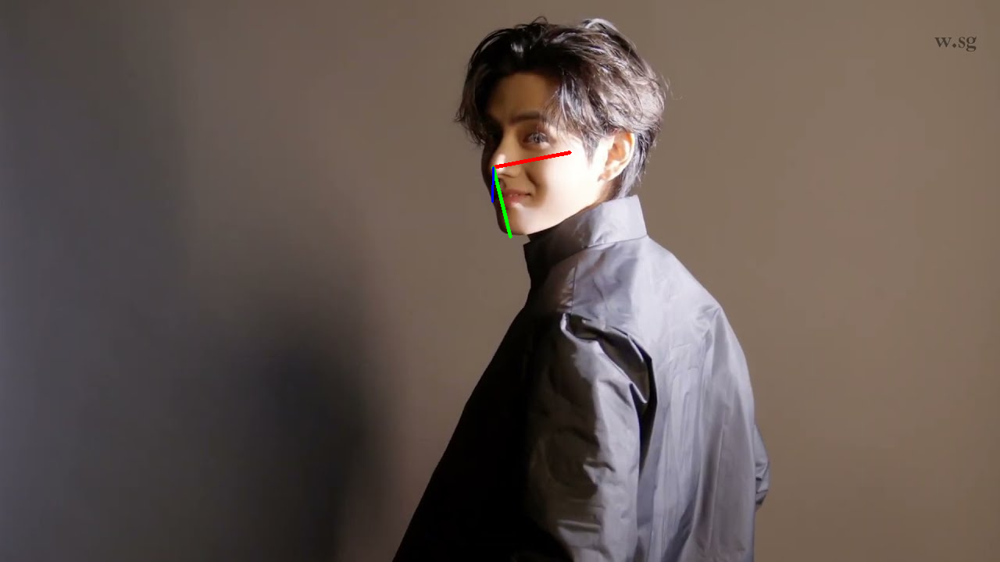

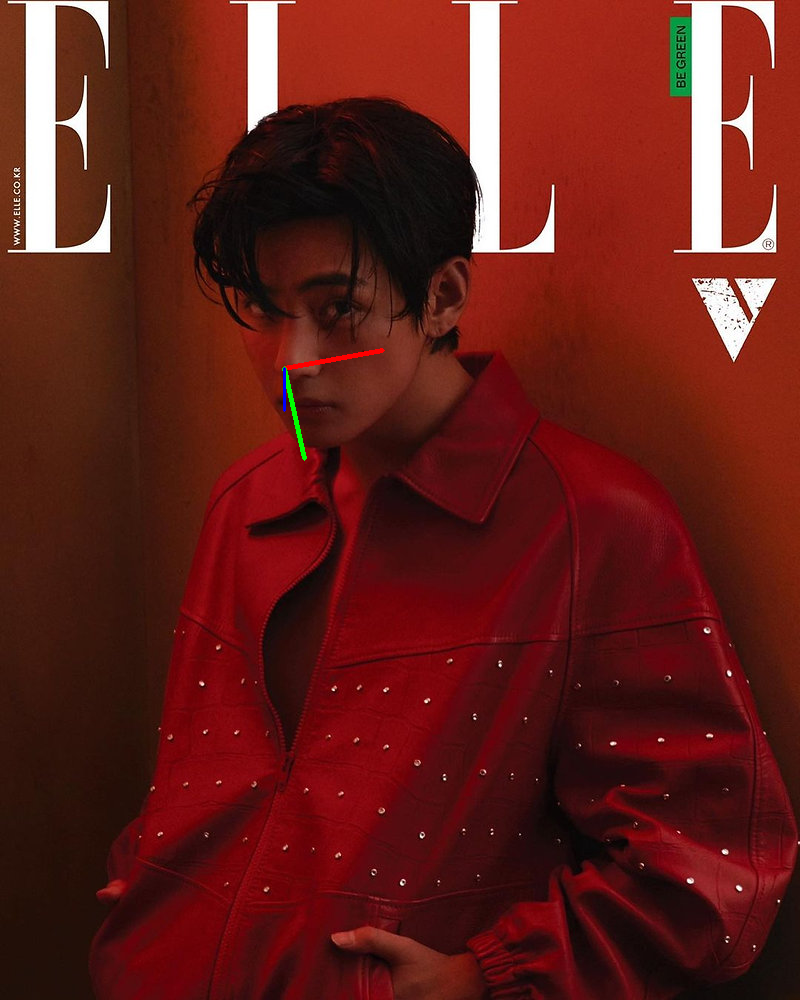

In [ ]:
for i in range(1, 7):
    img_path = f'/content/drive/MyDrive/test photos/test{i}.jpg'
    model = 'multi'
    axes_prediction(img_path, model)

# Features Selection (sklearn.feature_selection based)
###for cases that need high level of domain understanding, sklearn.feature_selection can be used to determind n features that related to the target. <br>
###It can be used to evaluate your own selection too.



### - f_regression [see doc](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.f_regression.html) <br>

simply, this function calculate `F-statistic` to determine whether there is a significant linear relationship between the feature and the target variable.<br>

- **High F-statistic:** Indicates that the explained variance is much greater than the unexplained variance. This suggests a strong relationship between the feature and the target variable, and the feature is likely important for predicting the target. <br>
- **Low F-statistic:** Indicates that the explained variance is not significantly greater than the unexplained variance. This suggests a weak or no relationship between the feature and the target variable.
<br>
<br>

f_regression also provides a `p-value` for each feature which Represents the probability of observing the data given that the null hypothesis (no relationship between the feature and the target variable) is true.
- **Low p-value (typically < 0.05):** Indicates that the feature is statistically significant and likely has a meaningful relationship with the target variable.
- **High p-value:** Indicates that the feature is not statistically significant and may not have a meaningful relationship with the target variable.

In [ ]:
# Define features (x and y coordinates of facial landmarks, pitch, yaw, and roll)
features = df.drop(["pitch", "yaw", "roll"], axis=1)  # Exclude pitch, yaw, and roll columns

# Define target variable (you may have a target variable if you're doing regression)
# If you don't have a target variable, you can skip this step
target = df[["pitch", "yaw", "roll"]]

# Perform feature selection for each target variable separately
selected_features = []
for target_name in target.columns:
    # Perform feature selection using SelectKBest with f_regression scoring function
    k = 5  # Number of top features to select
    selector = SelectKBest(score_func=f_regression, k=k)

    # Fit selector to the features and target and transform features
    selected_features_indices = selector.fit(features, target[target_name]).get_support(indices=True)
    selected_features.append(features.columns[selected_features_indices])

# Print selected feature names for each target variable
for i, target_name in enumerate(target.columns):
    print(f"Selected features for {target_name}: {selected_features[i]}")

Selected features for pitch: Index(['y_2', 'y_94', 'y_97', 'y_326', 'y_370'], dtype='object')
Selected features for yaw: Index(['x_323', 'x_356', 'x_361', 'x_429', 'x_454'], dtype='object')
Selected features for roll: Index(['x_1', 'y_45', 'y_275', 'y_440', 'y_457'], dtype='object')


### I decided to make a dataframe for each target as other features may affect negatively the performance of other target and see if this technique can be a better pipline for this problem.

In [ ]:
pitch_columns_to_extract = ['y_2', 'y_94', 'y_97', 'y_326', 'y_370', 'pitch']
yaw_columns_to_extract = ['x_323', 'x_356', 'x_361', 'x_429', 'x_454', 'yaw']
roll_columns_to_extract = ['x_1', 'y_45', 'y_275', 'y_440', 'y_457', 'roll']

# Create a new DataFrame with the specified columns
pitch_df = df[pitch_columns_to_extract]
yaw_df = df[yaw_columns_to_extract]
roll_df = df[roll_columns_to_extract]

### I will optimize by huber regression for every target, as it's the best model in time and performance

In [ ]:
# dataframe spliting
pitch = pitch_df[['pitch']]
features = pitch_df.drop(['pitch'], axis=1)
x_train, x_validation, y_train, y_validation = train_test_split(features, pitch, test_size=0.2, random_state=42)

# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Huber Regression model
    huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

    # Fit the model
    huber.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, huber.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-22 08:30:19,492] A new study created in memory with name: no-name-f9fd8ff9-8193-4932-bebb-1fd8dbef59e1
[I 2024-05-22 08:30:19,779] Trial 0 finished with value: 0.1734741390719921 and parameters: {'epsilon': 1.943184153070167, 'alpha': 1.774144401379498, 'fit_intercept': True, 'max_iter': 481}. Best is trial 0 with value: 0.1734741390719921.
[I 2024-05-22 08:30:20,080] Trial 1 finished with value: 0.1748054186673885 and parameters: {'epsilon': 1.2329077482147435, 'alpha': 45.3097573529142, 'fit_intercept': True, 'max_iter': 128}. Best is trial 0 with value: 0.1734741390719921.
[I 2024-05-22 08:30:20,383] Trial 2 finished with value: 0.1744354926239696 and parameters: {'epsilon': 1.4002508027917724, 'alpha': 17.951953617772215, 'fit_intercept': True, 'max_iter': 755}. Best is trial 0 with value: 0.1734741390719921.
[I 2024-05-22 08:30:20,511] Trial 3 finished with value: 0.18438653964648083 and parameters: {'epsilon': 1.7146764373765606, 'alpha': 0.02188714698452586, 'fit_inte

Best Hyperparameters: {'epsilon': 1.9999245564422594, 'alpha': 0.009340846425761707, 'fit_intercept': True, 'max_iter': 881}
Best Validation RMSE: 0.1733784848773761


In [ ]:
# dataframe spliting
yaw = yaw_df[['yaw']]
features = yaw_df.drop(['yaw'], axis=1)
x_train, x_validation, y_train, y_validation = train_test_split(features, yaw, test_size=0.2, random_state=42)

# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Huber Regression model
    huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

    # Fit the model
    huber.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, huber.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-22 21:25:43,055] A new study created in memory with name: no-name-95d57b92-f39e-447b-816c-7b8575b6d1d4
[I 2024-05-22 21:25:43,163] Trial 0 finished with value: 0.16366473838298015 and parameters: {'epsilon': 1.5306391132129906, 'alpha': 0.8779899234879286, 'fit_intercept': False, 'max_iter': 648}. Best is trial 0 with value: 0.16366473838298015.
[I 2024-05-22 21:25:43,290] Trial 1 finished with value: 0.15326425627337242 and parameters: {'epsilon': 1.492079112373865, 'alpha': 0.2607926044246872, 'fit_intercept': True, 'max_iter': 727}. Best is trial 1 with value: 0.15326425627337242.
[I 2024-05-22 21:25:43,355] Trial 2 finished with value: 0.16360863275431176 and parameters: {'epsilon': 1.6790821277010926, 'alpha': 3.235659870322435, 'fit_intercept': False, 'max_iter': 216}. Best is trial 1 with value: 0.15326425627337242.
[I 2024-05-22 21:25:43,413] Trial 3 finished with value: 0.16398294155563828 and parameters: {'epsilon': 1.303492159566324, 'alpha': 0.08316203074539767, 

Best Hyperparameters: {'epsilon': 1.9337180563929377, 'alpha': 0.003169496156379685, 'fit_intercept': True, 'max_iter': 101}
Best Validation RMSE: 0.15116480419394515


In [ ]:
# dataframe spliting
roll = roll_df[['roll']]
features = roll_df.drop(['roll'], axis=1)
x_train, x_validation, y_train, y_validation = train_test_split(features, roll, test_size=0.2, random_state=42)

# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Huber Regression model
    huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

    # Fit the model
    huber.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, huber.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-22 21:26:33,980] A new study created in memory with name: no-name-b85de87f-80d6-40e5-8e01-ca5eb47c802a
[I 2024-05-22 21:26:34,042] Trial 0 finished with value: 0.1533255186649405 and parameters: {'epsilon': 1.8344384411356807, 'alpha': 0.007245279430424959, 'fit_intercept': True, 'max_iter': 673}. Best is trial 0 with value: 0.1533255186649405.
[I 2024-05-22 21:26:34,077] Trial 1 finished with value: 0.1554151198099255 and parameters: {'epsilon': 1.737463265532, 'alpha': 0.12565559938589946, 'fit_intercept': False, 'max_iter': 880}. Best is trial 0 with value: 0.1533255186649405.
[I 2024-05-22 21:26:34,127] Trial 2 finished with value: 0.15587267226783694 and parameters: {'epsilon': 1.1889209124922344, 'alpha': 833.7550978616616, 'fit_intercept': True, 'max_iter': 189}. Best is trial 0 with value: 0.1533255186649405.
[I 2024-05-22 21:26:34,178] Trial 3 finished with value: 0.15506045231697008 and parameters: {'epsilon': 1.3695461251846313, 'alpha': 0.044737373688920896, 'fit

Best Hyperparameters: {'epsilon': 1.9999971308863176, 'alpha': 0.008908125056676717, 'fit_intercept': True, 'max_iter': 689}
Best Validation RMSE: 0.15267637265288944


### let's try a multi-regressor

In [ ]:
merged_df = pd.concat([pitch_df, yaw_df, roll_df], axis=1)
labels = merged_df[['pitch', 'yaw', 'roll']]
features = merged_df.drop(['pitch', 'yaw', 'roll'], axis=1)
x_train, x_validation, y_train, y_validation = train_test_split(features, labels, test_size=0.2, random_state=42)


# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Huber Regression model
    huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

    # Create MultiOutputRegressor
    multi_out_huber = MultiOutputRegressor(huber)

    # Fit the model
    multi_out_huber.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, multi_out_huber.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-22 21:35:33,081] A new study created in memory with name: no-name-b9ac556b-4b86-4be9-b49f-87b995e7270c
[I 2024-05-22 21:35:33,735] Trial 0 finished with value: 0.15064537774325498 and parameters: {'epsilon': 1.2580797068972982, 'alpha': 0.0015385835057827016, 'fit_intercept': False, 'max_iter': 318}. Best is trial 0 with value: 0.15064537774325498.
[I 2024-05-22 21:35:34,211] Trial 1 finished with value: 0.15069895072636483 and parameters: {'epsilon': 1.3379260026617534, 'alpha': 33.76392050423403, 'fit_intercept': False, 'max_iter': 245}. Best is trial 0 with value: 0.15064537774325498.
[I 2024-05-22 21:35:35,491] Trial 2 finished with value: 0.14788577671221642 and parameters: {'epsilon': 1.5921792161165371, 'alpha': 0.5313524345623816, 'fit_intercept': True, 'max_iter': 683}. Best is trial 2 with value: 0.14788577671221642.
[I 2024-05-22 21:35:36,642] Trial 3 finished with value: 0.14761473364319766 and parameters: {'epsilon': 1.9119220897574412, 'alpha': 404.682999525618

Best Hyperparameters: {'epsilon': 1.9959033711065357, 'alpha': 0.0017067648285102584, 'fit_intercept': True, 'max_iter': 995}
Best Validation RMSE: 0.14512711612925977


RMSE is lower than mean RMSE of 3 models but took more time on training than the other 3 models.

###test pitch-yaw-roll models on photos

In [ ]:
# dataframes spliting
pitch = pitch_df[['pitch']]
pitch_features = pitch_df.drop(['pitch'], axis=1)
yaw = yaw_df[['yaw']]
yaw_features = yaw_df.drop(['yaw'], axis=1)
roll = roll_df[['roll']]
roll_features = roll_df.drop(['roll'], axis=1)

pitch_features_train, pitch_features_validation, pitch_train, pitch_validation = train_test_split(pitch_features, pitch, test_size=0.2, random_state=42)
yaw_features_train, yaw_features_validation, yaw_train, yaw_validation = train_test_split(yaw_features, yaw, test_size=0.2, random_state=42)
roll_features_train, roll_features_validation, roll_train, roll_validation = train_test_split(roll_features, roll, test_size=0.2, random_state=42)


# train 3 models
pitch_model = HuberRegressor(epsilon=1.9999245564422594, alpha=0.009340846425761707, fit_intercept=True, max_iter=881).fit(pitch_features_train, pitch_train)
yaw_model = HuberRegressor(epsilon=1.9337180563929377, alpha=0.003169496156379685, fit_intercept=True, max_iter=101).fit(yaw_features_train, yaw_train)
roll_model = HuberRegressor(epsilon=1.9999971308863176, alpha=0.008908125056676717, fit_intercept=True, max_iter=689).fit(roll_features_train, roll_train)


# Make predictions
pitch_pred_train = pitch_model.predict(pitch_features_train)
pitch_pred_test = pitch_model.predict(pitch_features_validation)

yaw_pred_train = yaw_model.predict(yaw_features_train)
yaw_pred_test = yaw_model.predict(yaw_features_validation)

roll_pred_train = roll_model.predict(roll_features_train)
roll_pred_test = roll_model.predict(roll_features_validation)

# Evaluate the model
mse_train_pitch = mean_squared_error(pitch_train, pitch_pred_train)
mse_test_pitch = mean_squared_error(pitch_validation, pitch_pred_test)
r2_train_pitch = r2_score(pitch_train, pitch_pred_train)
r2_test_pitch = r2_score(pitch_validation, pitch_pred_test)

mse_train_yaw = mean_squared_error(yaw_train, yaw_pred_train)
mse_test_yaw = mean_squared_error(yaw_validation, yaw_pred_test)
r2_train_yaw = r2_score(yaw_train, yaw_pred_train)
r2_test_yaw = r2_score(yaw_validation, yaw_pred_test)

mse_train_roll = mean_squared_error(roll_train, roll_pred_train)
mse_test_roll = mean_squared_error(roll_validation, roll_pred_test)
r2_train_roll = r2_score(roll_train, roll_pred_train)
r2_test_roll = r2_score(roll_validation, roll_pred_test)


# Print evaluation metrics
print('Pitch Evaluation')
print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_pitch, mse_test_pitch))
print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_pitch, r2_test_pitch))
print('\n')
print('Yaw Evaluation')
print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_yaw, mse_test_yaw))
print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_yaw, r2_test_yaw))
print('\n')
print('Roll Evaluation')
print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_roll, mse_test_roll))
print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_roll, r2_test_roll))

Pitch Evaluation
Mean Squared Error (MSE) - Train: 0.3118, Test: 0.0301
R-squared (R2) - Train: 0.1270, Test: 0.6210


Yaw Evaluation
Mean Squared Error (MSE) - Train: 0.0565, Test: 0.0229
R-squared (R2) - Train: 0.8338, Test: 0.9280


Roll Evaluation
Mean Squared Error (MSE) - Train: 0.3798, Test: 0.0233
R-squared (R2) - Train: 0.2371, Test: 0.7967


In [ ]:
def axes_prediction_n(img_path):
    pitch_y_landmarks = [2, 94, 97, 326, 370]
    yaw_x_landmarks = [323, 356, 361, 429, 454]
    roll_y_landmarks = [45, 275, 440, 457]
    roll_x_landmarks = [1]
    pitch_data = []
    yaw_data = []
    roll_data = []

    faceModule = mediapipe.solutions.face_mesh

    # Loading the image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Creating a FaceMesh instance
    with faceModule.FaceMesh(static_image_mode=True) as faces:

        # Processing the face to extract the landmark points for x, y
        results = faces.process(image)

        # Checking if there are multiple face landmarks detected
        if results.multi_face_landmarks:

            # Looping over the faces in the image
                  for idx, lm in enumerate(results.multi_face_landmarks[0].landmark):
                    if idx == 4:
                      nose_x = lm.x
                      nose_y = lm.y

                    if idx == 291:
                      lower_x = lm.x
                      lower_y = lm.y

                    if idx == 33:
                      upper_x = lm.x
                      upper_y = lm.y

                  distance_x = upper_x - lower_x
                  distance_y = upper_y - lower_y
                  distance = np.sqrt(distance_x**2 + distance_y**2)
                  shape = image.shape
                  for idx, landmark in enumerate(results.multi_face_landmarks[0].landmark):
                      x = (landmark.x - nose_x) / distance
                      y = (landmark.y - nose_y) / distance
                      shape = image.shape
                      x = int(x * shape[1])
                      y = int(y * shape[0])

                      if idx in pitch_y_landmarks:
                        pitch_data.extend([y])

                      if idx in yaw_x_landmarks:
                        yaw_data.extend([x])

                      if idx in roll_x_landmarks:
                        roll_data.extend([x])

                      if idx in roll_y_landmarks:
                        roll_data.extend([y])

    pitch_data = np.array(pitch_data)
    pitch_data = pitch_data.reshape(1, -1)
    pitch = pitch_model.predict(pitch_data)

    yaw_data = np.array(yaw_data)
    yaw_data = yaw_data.reshape(1, -1)
    yaw = yaw_model.predict(yaw_data)

    roll_data = np.array(roll_data)
    roll_data = roll_data.reshape(1, -1)
    roll = roll_model.predict(roll_data)

    h, w, c = image.shape
    center_point = (nose_x * w, nose_y * h)

    cv2_imshow(draw_axes(image, pitch, yaw, roll, center_point))

    return

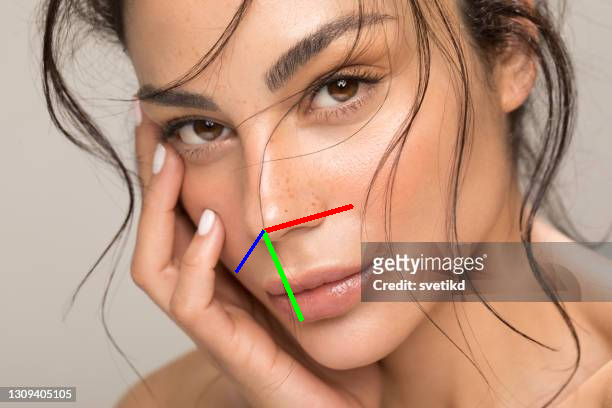

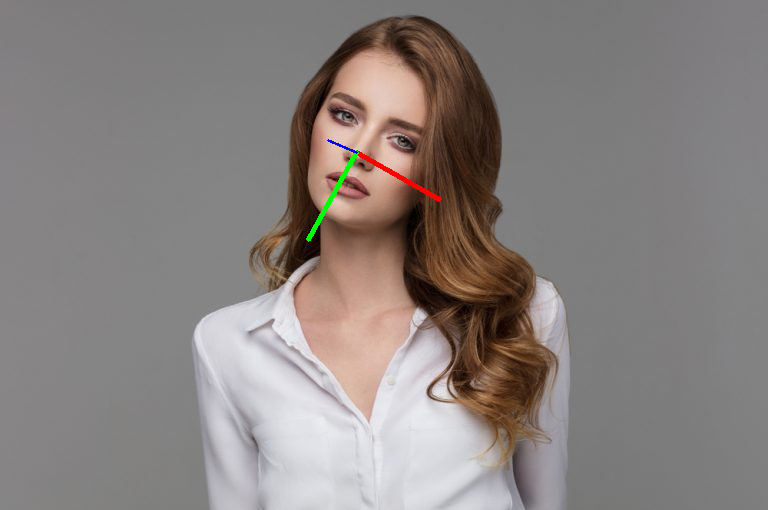

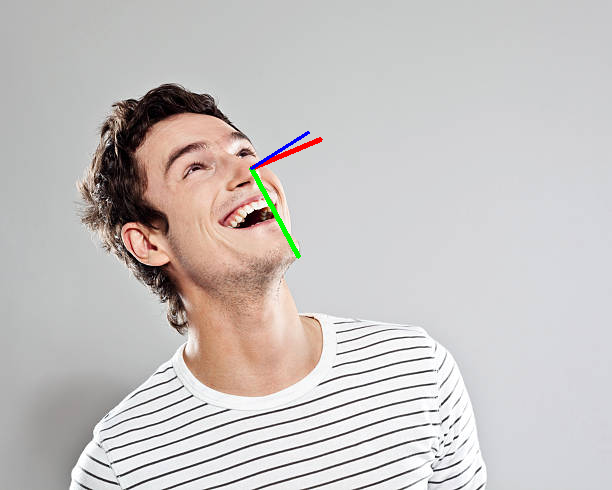

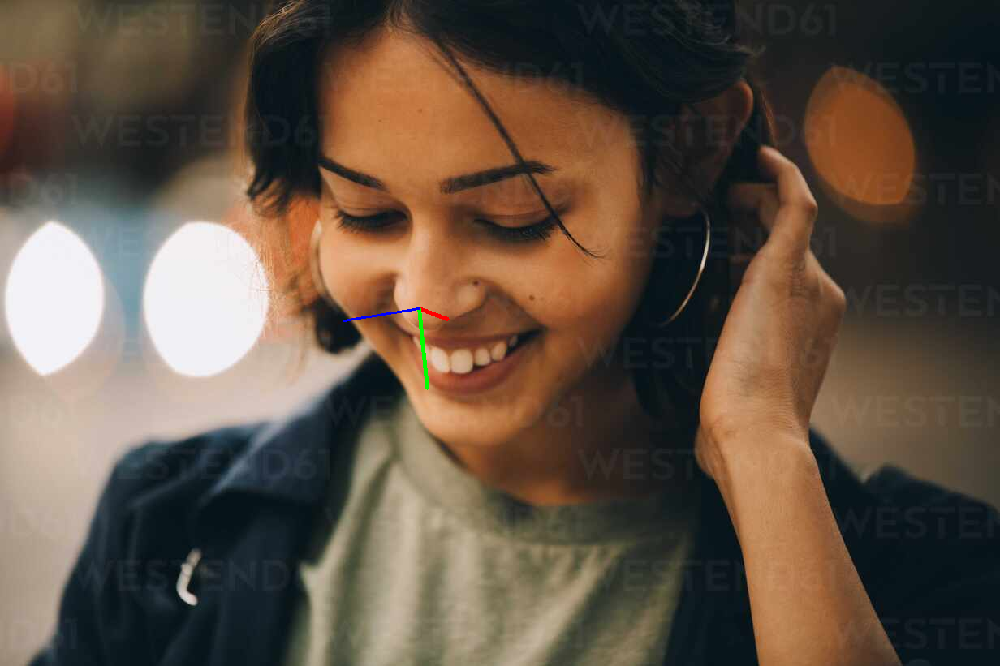

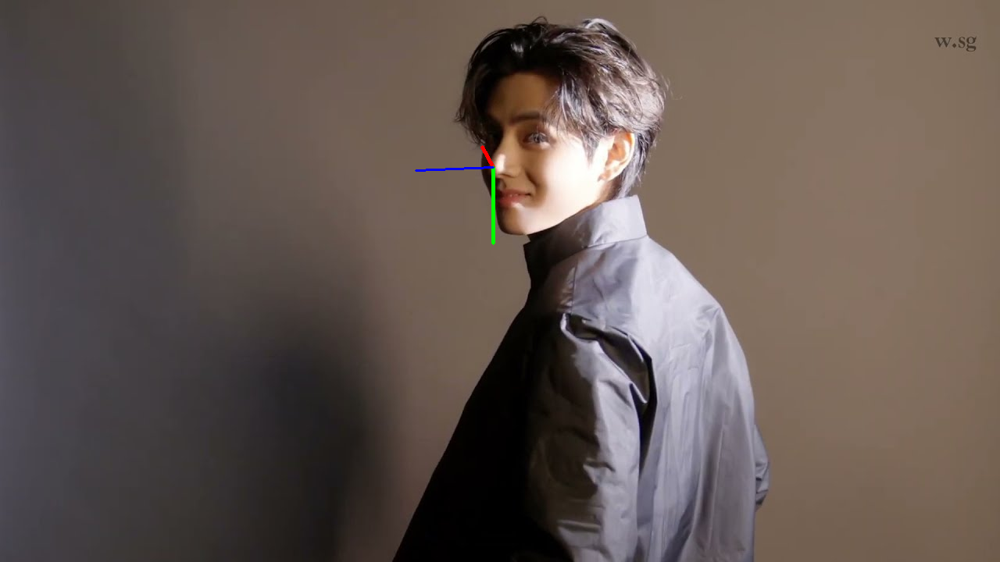

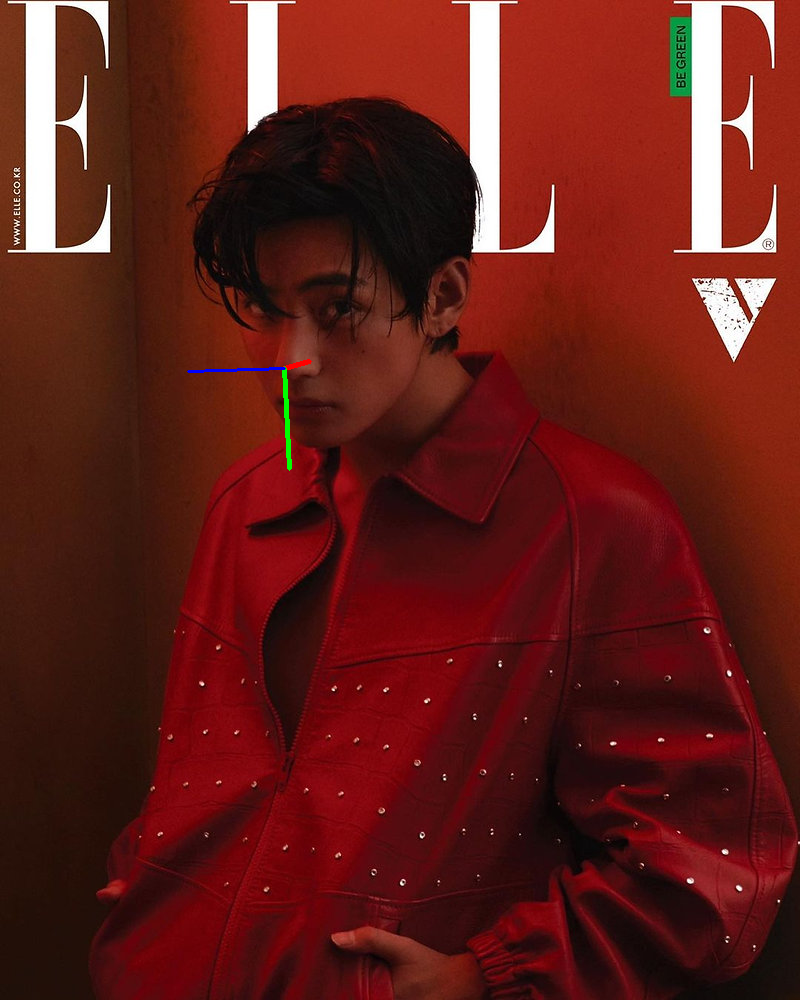

In [ ]:
for i in range(1, 7):
    img_path = f'/content/drive/MyDrive/test photos/test{i}.jpg'
    axes_prediction_n(img_path)

### - mutual_info_regression [see doc](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_regression.html) <br>

Mutual Information Regression is a method used to evaluate the dependency between two variables. In the context of feature selection, it helps to measure the dependency between each feature and the target variable. This method is especially useful when the relationship between variables is not linear.<br>

- **Mutual Information (MI):** MI is a measure of the amount of information that one variable contains about another variable. In regression, it quantifies the reduction in uncertainty about the target variable provided by the knowledge of the feature variable.
- **Non-parametric Method:** Mutual information is non-parametric, meaning it does not assume a specific distribution for the data, making it suitable for capturing any kind of relationship between variables, whether linear or non-linear.
- **Feature Selection:** In feature selection, mutual information can be used to rank features based on how much information they share with the target variable. Features with higher mutual information scores are considered more relevant.
<br>
<br>

Limitations of Mutual Information
- **Computational Complexity:** Calculating MI, especially for large datasets or high-dimensional data, can be computationally expensive.
- **Sensitivity to Noise:** MI can be sensitive to noise in the data, which may affect the reliability of the feature selection process.

In [ ]:
# Define features (x and y coordinates of facial landmarks, pitch, yaw, and roll)
features = df.drop(["pitch", "yaw", "roll"], axis=1)  # Exclude pitch, yaw, and roll columns

# Define target variable (you may have a target variable if you're doing regression)
# If you don't have a target variable, you can skip this step
target = df[["pitch", "yaw", "roll"]]

# Perform feature selection for each target variable separately
selected_features = []
for target_name in target.columns:
    # Perform feature selection using SelectKBest with f_regression scoring function
    k = 5  # Number of top features to select
    selector = SelectKBest(score_func=mutual_info_regression, k=k)

    # Fit selector to the features and target and transform features
    selected_features_indices = selector.fit(features, target[target_name]).get_support(indices=True)
    selected_features.append(features.columns[selected_features_indices])

# Print selected feature names for each target variable
for i, target_name in enumerate(target.columns):
    print(f"Selected features for {target_name}: {selected_features[i]}")

Selected features for pitch: Index(['y_2', 'y_128', 'y_233', 'y_244', 'y_245'], dtype='object')
Selected features for yaw: Index(['x_123', 'x_137', 'x_142', 'x_209', 'x_352'], dtype='object')
Selected features for roll: Index(['x_1', 'x_44', 'y_45', 'x_274', 'y_275'], dtype='object')


### we will go thruogh the same sequence here too.

In [ ]:
pitch_columns_to_extract = ['y_2', 'y_128', 'y_233', 'y_244', 'y_245', 'pitch']
yaw_columns_to_extract = ['x_137', 'x_142', 'x_209', 'x_227', 'x_352', 'yaw']
roll_columns_to_extract = ['x_1', 'x_44', 'y_45', 'x_274', 'y_275', 'roll']


# Create a new DataFrame with the specified columns
pitch_df = df[pitch_columns_to_extract]
yaw_df = df[yaw_columns_to_extract]
roll_df = df[roll_columns_to_extract]

In [ ]:
# dataframe spliting
pitch = pitch_df[['pitch']]
features = pitch_df.drop(['pitch'], axis=1)
x_train, x_validation, y_train, y_validation = train_test_split(features, pitch, test_size=0.2, random_state=42)

# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Huber Regression model
    huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

    # Fit the model
    huber.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, huber.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-27 12:01:06,030] A new study created in memory with name: no-name-be3bfb8c-e2aa-4e2e-a4ce-52e9387c563f
[I 2024-05-27 12:01:06,087] Trial 0 finished with value: 0.14205279748052935 and parameters: {'epsilon': 1.1433623797816328, 'alpha': 0.8869518839380942, 'fit_intercept': False, 'max_iter': 563}. Best is trial 0 with value: 0.14205279748052935.
[I 2024-05-27 12:01:06,147] Trial 1 finished with value: 0.14162256841401397 and parameters: {'epsilon': 1.9905127858526486, 'alpha': 0.6055310689185572, 'fit_intercept': False, 'max_iter': 807}. Best is trial 1 with value: 0.14162256841401397.
[I 2024-05-27 12:01:06,227] Trial 2 finished with value: 0.14168504852899966 and parameters: {'epsilon': 1.743280508437819, 'alpha': 0.007980948220674201, 'fit_intercept': False, 'max_iter': 402}. Best is trial 1 with value: 0.14162256841401397.
[I 2024-05-27 12:01:06,297] Trial 3 finished with value: 0.1416785614815222 and parameters: {'epsilon': 1.4595405887466508, 'alpha': 0.498398725514282

Best Hyperparameters: {'epsilon': 1.9997323565143361, 'alpha': 0.04957223595442553, 'fit_intercept': False, 'max_iter': 688}
Best Validation RMSE: 0.14161824896855682


In [ ]:
# dataframe spliting
yaw = yaw_df[['yaw']]
features = yaw_df.drop(['yaw'], axis=1)
x_train, x_validation, y_train, y_validation = train_test_split(features, yaw, test_size=0.2, random_state=42)

# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Huber Regression model
    huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

    # Fit the model
    huber.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, huber.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-27 12:01:26,223] A new study created in memory with name: no-name-0f97fd1d-379e-4e44-b3d3-1ac2472e4aba
[I 2024-05-27 12:01:26,256] Trial 0 finished with value: 0.13629548390327256 and parameters: {'epsilon': 1.6667039277094333, 'alpha': 0.00467456202639999, 'fit_intercept': False, 'max_iter': 855}. Best is trial 0 with value: 0.13629548390327256.
[I 2024-05-27 12:01:26,293] Trial 1 finished with value: 0.13667105267675123 and parameters: {'epsilon': 1.2779824103077462, 'alpha': 0.008300140798342737, 'fit_intercept': True, 'max_iter': 589}. Best is trial 0 with value: 0.13629548390327256.
[I 2024-05-27 12:01:26,332] Trial 2 finished with value: 0.1366738569804807 and parameters: {'epsilon': 1.177133585473115, 'alpha': 0.2715961740529333, 'fit_intercept': False, 'max_iter': 669}. Best is trial 0 with value: 0.13629548390327256.
[I 2024-05-27 12:01:26,366] Trial 3 finished with value: 0.13633850682752197 and parameters: {'epsilon': 1.625512494599299, 'alpha': 637.6439446607842,

Best Hyperparameters: {'epsilon': 1.9994641279035315, 'alpha': 0.006745077157609172, 'fit_intercept': False, 'max_iter': 460}
Best Validation RMSE: 0.13609614149236093


In [ ]:
# dataframe spliting
roll = roll_df[['roll']]
features = roll_df.drop(['roll'], axis=1)
x_train, x_validation, y_train, y_validation = train_test_split(features, roll, test_size=0.2, random_state=42)

# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Huber Regression model
    huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

    # Fit the model
    huber.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, huber.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-27 12:01:37,353] A new study created in memory with name: no-name-eef71375-9520-45f9-a82d-e6061fdac7a0
[I 2024-05-27 12:01:37,391] Trial 0 finished with value: 0.14468789837298496 and parameters: {'epsilon': 1.687431410297769, 'alpha': 0.8497652840288786, 'fit_intercept': False, 'max_iter': 738}. Best is trial 0 with value: 0.14468789837298496.
[I 2024-05-27 12:01:37,423] Trial 1 finished with value: 0.1461933086999375 and parameters: {'epsilon': 1.3106370603349677, 'alpha': 0.001505822171367609, 'fit_intercept': False, 'max_iter': 867}. Best is trial 0 with value: 0.14468789837298496.
[I 2024-05-27 12:01:37,476] Trial 2 finished with value: 0.14484404989348174 and parameters: {'epsilon': 1.9573843139569944, 'alpha': 554.7308549832368, 'fit_intercept': True, 'max_iter': 503}. Best is trial 0 with value: 0.14468789837298496.
[I 2024-05-27 12:01:37,528] Trial 3 finished with value: 0.14668014432428805 and parameters: {'epsilon': 1.4671168507221584, 'alpha': 14.828591746237684,

Best Hyperparameters: {'epsilon': 1.9999514335330297, 'alpha': 0.005089676743868569, 'fit_intercept': False, 'max_iter': 196}
Best Validation RMSE: 0.14349737924470898


In [ ]:
merged_df = pd.concat([pitch_df, yaw_df, roll_df], axis=1)
labels = merged_df[['pitch', 'yaw', 'roll']]
features = merged_df.drop(['pitch', 'yaw', 'roll'], axis=1)
x_train, x_validation, y_train, y_validation = train_test_split(features, labels, test_size=0.2, random_state=42)


# Define objective function for Optuna
def objective(trial):
    # Define hyperparameters to tune
    epsilon = trial.suggest_uniform('epsilon', 1.1, 2.0)
    alpha = trial.suggest_loguniform('alpha', 1e-3, 1e3)
    fit_intercept = trial.suggest_categorical('fit_intercept', [True, False])
    max_iter = trial.suggest_int('max_iter', 100, 1000)

    # Create Huber Regression model
    huber = HuberRegressor(epsilon=epsilon, alpha=alpha, fit_intercept=fit_intercept, max_iter=max_iter)

    # Create MultiOutputRegressor
    multi_out_huber = MultiOutputRegressor(huber)

    # Fit the model
    multi_out_huber.fit(x_train, y_train)

    # Calculate validation RMSE
    validation_rmse = np.sqrt(mean_squared_error(y_validation, multi_out_huber.predict(x_validation)))

    return validation_rmse

# Create a study object and optimize the objective function
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)

# Get the best hyperparameters and their corresponding objective value
best_params = study.best_params
best_rmse = study.best_value

print("Best Hyperparameters:", best_params)
print("Best Validation RMSE:", best_rmse)

[I 2024-05-27 08:55:48,948] A new study created in memory with name: no-name-32028f34-1ff0-4538-82fa-6c072a428918
[I 2024-05-27 08:55:49,561] Trial 0 finished with value: 0.13917091177148372 and parameters: {'epsilon': 1.9155323577239263, 'alpha': 0.025858671160813116, 'fit_intercept': False, 'max_iter': 307}. Best is trial 0 with value: 0.13917091177148372.
[I 2024-05-27 08:55:50,404] Trial 1 finished with value: 0.14107358738583267 and parameters: {'epsilon': 1.1270471658511996, 'alpha': 1.6784384164179789, 'fit_intercept': True, 'max_iter': 375}. Best is trial 0 with value: 0.13917091177148372.
[I 2024-05-27 08:55:50,690] Trial 2 finished with value: 0.14219328985718027 and parameters: {'epsilon': 1.1904461861325428, 'alpha': 50.91827342368174, 'fit_intercept': True, 'max_iter': 118}. Best is trial 0 with value: 0.13917091177148372.
[I 2024-05-27 08:55:51,225] Trial 3 finished with value: 0.13969745854876092 and parameters: {'epsilon': 1.613609798597433, 'alpha': 0.00277596208359338

Best Hyperparameters: {'epsilon': 1.9749624925951166, 'alpha': 0.464999428620602, 'fit_intercept': True, 'max_iter': 842}
Best Validation RMSE: 0.13892789057823665


##features based on mutual_info_regression made a better performance, which is logical for a non-linear problem.

### test pitch-yaw-roll models

In [ ]:
# dataframes spliting
pitch = pitch_df[['pitch']]
pitch_features = pitch_df.drop(['pitch'], axis=1)
yaw = yaw_df[['yaw']]
yaw_features = yaw_df.drop(['yaw'], axis=1)
roll = roll_df[['roll']]
roll_features = roll_df.drop(['roll'], axis=1)

pitch_features_train, pitch_features_validation, pitch_train, pitch_validation = train_test_split(pitch_features, pitch, test_size=0.2, random_state=42)
yaw_features_train, yaw_features_validation, yaw_train, yaw_validation = train_test_split(yaw_features, yaw, test_size=0.2, random_state=42)
roll_features_train, roll_features_validation, roll_train, roll_validation = train_test_split(roll_features, roll, test_size=0.2, random_state=42)


# train 3 models
pitch_model = HuberRegressor(epsilon=1.9997323565143361, alpha=0.04957223595442553, fit_intercept=False, max_iter=688).fit(pitch_features_train, pitch_train)
yaw_model = HuberRegressor(epsilon=1.9994641279035315, alpha=0.006745077157609172, fit_intercept=False, max_iter=460).fit(yaw_features_train, yaw_train)
roll_model = HuberRegressor(epsilon=1.9999514335330297, alpha=0.005089676743868569, fit_intercept=False, max_iter=196).fit(roll_features_train, roll_train)


# Make predictions
pitch_pred_train = pitch_model.predict(pitch_features_train)
pitch_pred_test = pitch_model.predict(pitch_features_validation)

yaw_pred_train = yaw_model.predict(yaw_features_train)
yaw_pred_test = yaw_model.predict(yaw_features_validation)

roll_pred_train = roll_model.predict(roll_features_train)
roll_pred_test = roll_model.predict(roll_features_validation)

# Evaluate the model
mse_train_pitch = mean_squared_error(pitch_train, pitch_pred_train)
mse_test_pitch = mean_squared_error(pitch_validation, pitch_pred_test)
r2_train_pitch = r2_score(pitch_train, pitch_pred_train)
r2_test_pitch = r2_score(pitch_validation, pitch_pred_test)

mse_train_yaw = mean_squared_error(yaw_train, yaw_pred_train)
mse_test_yaw = mean_squared_error(yaw_validation, yaw_pred_test)
r2_train_yaw = r2_score(yaw_train, yaw_pred_train)
r2_test_yaw = r2_score(yaw_validation, yaw_pred_test)

mse_train_roll = mean_squared_error(roll_train, roll_pred_train)
mse_test_roll = mean_squared_error(roll_validation, roll_pred_test)
r2_train_roll = r2_score(roll_train, roll_pred_train)
r2_test_roll = r2_score(roll_validation, roll_pred_test)


# Print evaluation metrics
print('Pitch Evaluation')
print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_pitch, mse_test_pitch))
print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_pitch, r2_test_pitch))
print('\n')
print('Yaw Evaluation')
print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_yaw, mse_test_yaw))
print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_yaw, r2_test_yaw))
print('\n')
print('Roll Evaluation')
print("Mean Squared Error (MSE) - Train: {:.4f}, Test: {:.4f}".format(mse_train_roll, mse_test_roll))
print("R-squared (R2) - Train: {:.4f}, Test: {:.4f}".format(r2_train_roll, r2_test_roll))

Pitch Evaluation
Mean Squared Error (MSE) - Train: 0.3072, Test: 0.0201
R-squared (R2) - Train: 0.1400, Test: 0.7471


Yaw Evaluation
Mean Squared Error (MSE) - Train: 0.0543, Test: 0.0185
R-squared (R2) - Train: 0.8404, Test: 0.9416


Roll Evaluation
Mean Squared Error (MSE) - Train: 0.3795, Test: 0.0206
R-squared (R2) - Train: 0.2378, Test: 0.8205


In [ ]:
def axes_prediction_n(img_path):
    pitch_y_landmarks = [2, 128, 233, 244, 245]
    yaw_x_landmarks = [137, 142, 209, 227, 352]
    roll_y_landmarks = [45, 274, 275]
    roll_x_landmarks = [1, 44]
    pitch_data = []
    yaw_data = []
    roll_data = []

    faceModule = mediapipe.solutions.face_mesh

    # Loading the image
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Creating a FaceMesh instance
    with faceModule.FaceMesh(static_image_mode=True) as faces:

        # Processing the face to extract the landmark points for x, y
        results = faces.process(image)

        # Checking if there are multiple face landmarks detected
        if results.multi_face_landmarks:

            # Looping over the faces in the image
                  for idx, lm in enumerate(results.multi_face_landmarks[0].landmark):
                    if idx == 4:
                      nose_x = lm.x
                      nose_y = lm.y

                    if idx == 291:
                      lower_x = lm.x
                      lower_y = lm.y

                    if idx == 33:
                      upper_x = lm.x
                      upper_y = lm.y

                  distance_x = upper_x - lower_x
                  distance_y = upper_y - lower_y
                  distance = np.sqrt(distance_x**2 + distance_y**2)
                  shape = image.shape
                  for idx, landmark in enumerate(results.multi_face_landmarks[0].landmark):
                      x = (landmark.x - nose_x) / distance
                      y = (landmark.y - nose_y) / distance
                      shape = image.shape
                      x = int(x * shape[1])
                      y = int(y * shape[0])

                      if idx in pitch_y_landmarks:
                        pitch_data.extend([y])

                      if idx in yaw_x_landmarks:
                        yaw_data.extend([x])

                      if idx in roll_x_landmarks:
                        roll_data.extend([x])

                      if idx in roll_y_landmarks:
                        roll_data.extend([y])

    pitch_data = np.array(pitch_data)
    pitch_data = pitch_data.reshape(1, -1)
    pitch = pitch_model.predict(pitch_data)

    yaw_data = np.array(yaw_data)
    yaw_data = yaw_data.reshape(1, -1)
    yaw = yaw_model.predict(yaw_data)

    roll_data = np.array(roll_data)
    roll_data = roll_data.reshape(1, -1)
    roll = roll_model.predict(roll_data)

    h, w, c = image.shape
    center_point = (nose_x * w, nose_y * h)

    cv2_imshow(draw_axes(image, pitch, yaw, roll, center_point))

    return

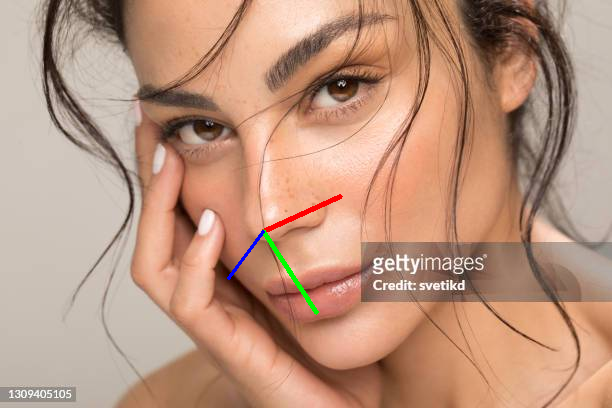

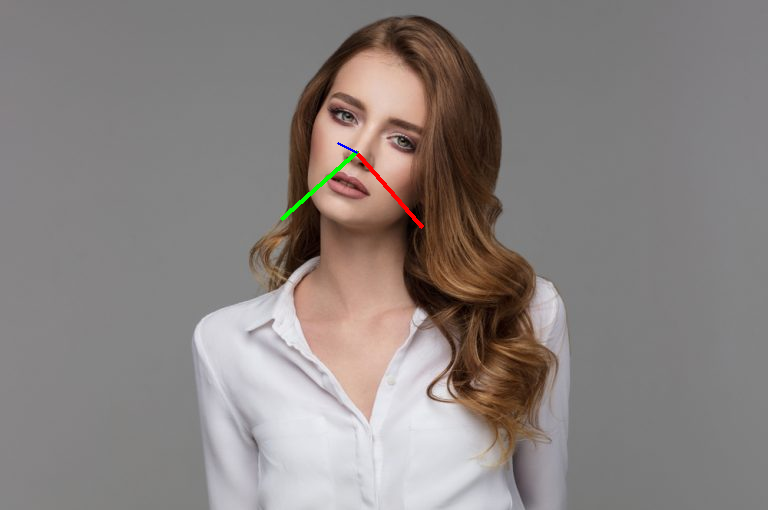

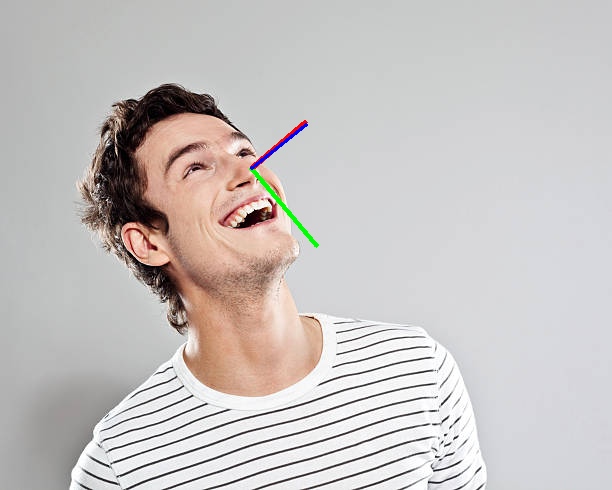

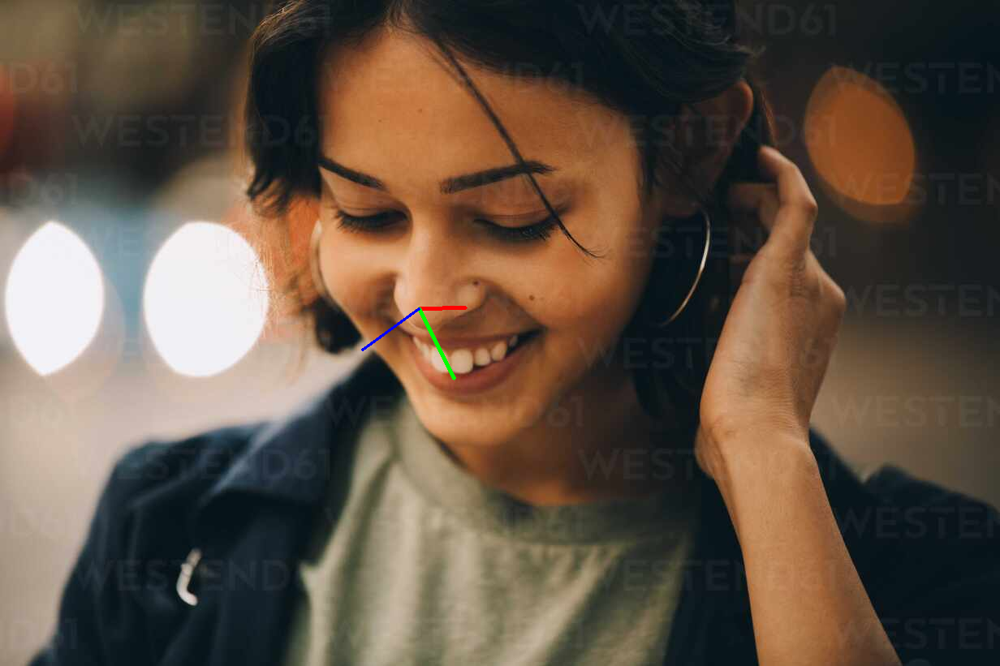

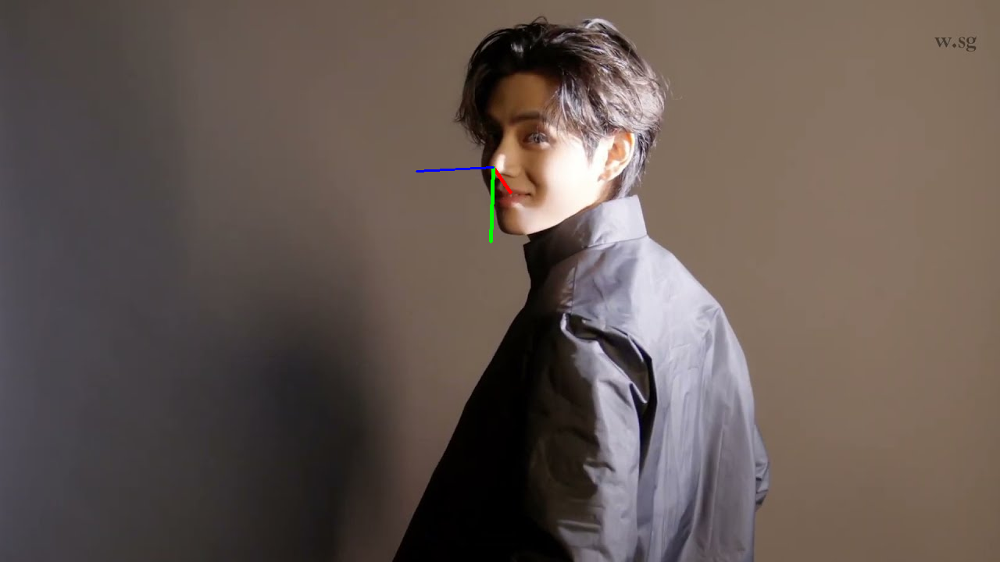

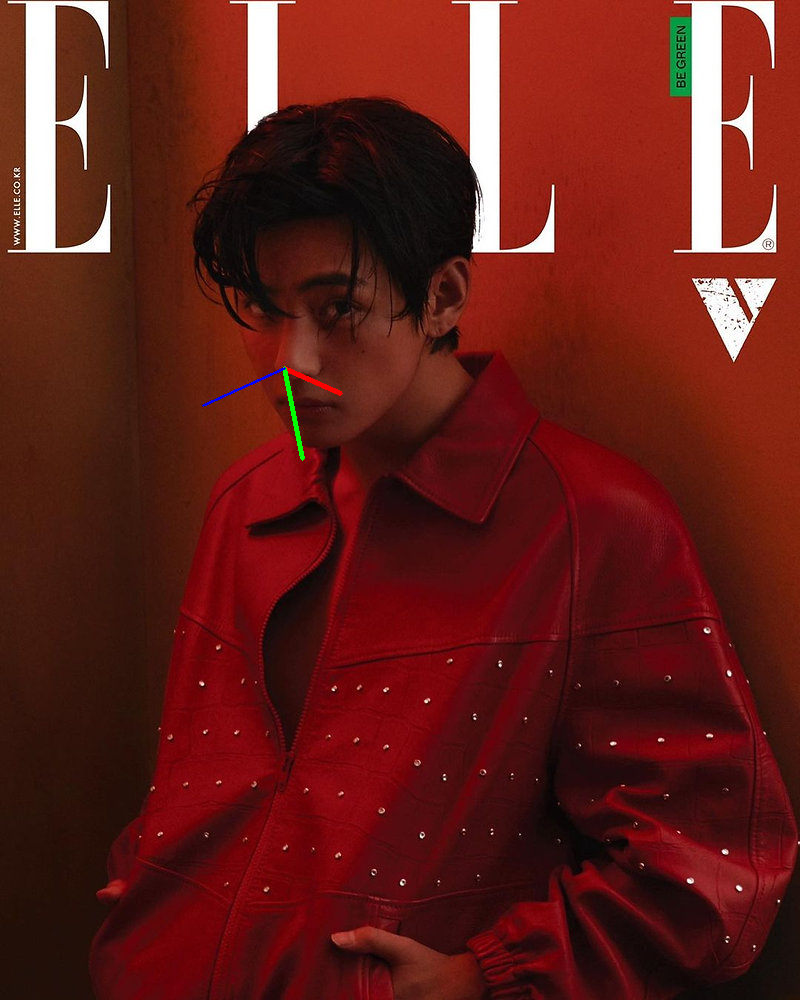

In [ ]:
for i in range(1, 7):
    img_path = f'/content/drive/MyDrive/test photos/test{i}.jpg'
    axes_prediction_n(img_path)